# TWITTER DATA ANALYSIS

## INTRODUCTION

This project is about using Data to help reach informed and/or scientific opinions for decision making using Data. As well known, good quality data directly implies more acurate, well informed outcomes in the decision making process can be achieved. In most cases, this Data is not readily available in great quality, and often needs to be put through a process of cleaning refered to herein in as Data Wrangling. As part of the Data Analytics course outcomes for the UDACITY'S Nanodegree program, the Data Wrangling Project will explore some main concepts about Data Wrangling to better test the student's ability to Gather, Assess, and Present this Data.

#### Data Wrangling 
This is the process of lceaning and transforming raw data into a much more meaningful, high quality Data Dramework that can be used for analytical purposes inorder to draw acurate and meaningful inferences from that Data. It is often the most critical point in the whole chain of Data analysis, as the decisions or inferences drawn thereof are dependent on the quality of the Data used.

## GATHERING THE DATA

The first step in this process will be to import all the relevant libraries that will be used for this project. This helps avoids repetitve coding.

In [1]:
#Importing all the libraries relevant to this investigation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import requests
import shutil
import json
import tweepy
import io
import os
import glob
import PIL.Image
from io import BytesIO
from PIL import Image

We will gather data from 3 sources that will be used for the purposes of this project. The source names of this data are:

    1. Twitter_Archive_Enhanced.csv
    2. Image_predictions.tsv
    3. Tweet_json.txt

#### 1. Twitter Archive Enhanced

This data source was readily provided as a CSV file, which could be directly downloaded via a link provided on the Udacity's projects dashboard.

In [2]:
#gathering the data
twitter_archive=pd.read_csv('twitter_archive_enhanced.csv')


In [3]:
#Reading the dataframe
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


#### 2. Image Predictions

This TSV file format data was also readiliy provided as a downloadable file via the student dashboard. The only issue about this data source was the indistinguishable columns with a "\" delemeter. This is removed by the code below so we can have a readable data frame as demonstrated henceforth.

In [4]:
#Downloading the file from the internet using the link provided
file_url = "https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv"
response = requests.get(file_url)

with open('image_predictions.tsv', mode ='wb') as file:
    file.write(response.content)

#Read TSV file
image_prediction = pd.read_csv('image_predictions.tsv', sep='\t' )

In [5]:
image_prediction

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


#### 3. Twitter

This Data source was provided in the form of a link that needed to be downloaded programmatically and converted from a Json text file, to a readable Dataframe in Pandas. The following will be the steps taken to achieve this objective.

In [6]:
#Creating folder using python
folder_name = 'TwitterJson'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
  
#Getting the URL
url='https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt'
response=requests.get(url)

#To view the raw data
response.content

#Saving the file to the computer
with open(os.path.join(folder_name, url.split('/')[-1]),mode='wb') as file:
        file.write(response.content)
        



In [7]:
#Define parameters
src= '/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter/TwitterJson/tweet-json.txt'
real_dst='/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter/tweet-json.txt'

#Use the Shutil function to move files
shutil.move(src,real_dst)

#Deleting the source folder named Twitter Json
myfile='/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter/TwitterJson'

## If file exists, delete it ##
if os.path.isfile(myfile):
    os.remove(myfile)


In [8]:
#Delete empty folder TwitterJson
empty_dir_path= '/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter/TwitterJson'
os.rmdir(empty_dir_path)

# Get the list of all files and directories to confirm if the empty folder has been deleted
path = '/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter'
dir_list = os.listdir(path)
 
print("Files and directories in '", path, "' :")
 
# prints all files
print(dir_list)

Files and directories in ' /Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter ' :
['wrangle_act.ipynb', '.DS_Store', 'Act_report.pdf', 'image_predictions.tsv', 'tweet-json.txt', 'wrangle_act.html', 'twitter_archive_enhanced.csv', '.ipynb_checkpoints']


In [9]:
#Renaming the saved file
old_name = 'tweet-json.txt'
new_name = 'tweet_json.txt'
os.rename(old_name, new_name)

In [10]:
#Extracting the required column
#Empty box
twitter_file=[]

#Reading the txt file using the Open function
with open('tweet_json.txt','r') as tweet_file:
    for line in tweet_file.readlines():
        single_tweet=json.loads(line) #Reading each json string into a dictionary
        #Accessing the required parameters
        tweet_id=single_tweet['id']
        retweet_cnt=single_tweet['retweet_count']
        fav_cnt=single_tweet['favorite_count']
        
        twitter_file.append({'id': tweet_id, 
                             'retweet_count':retweet_cnt, 
                             'favorite_count': fav_cnt })
        
tweet_data=pd.DataFrame(twitter_file, columns=['id',
                                              'retweet_count',
                                              'favorite_count'])



Below is our Tweet Data that will be used in our data wrangling assessment

In [11]:
#Reading the dataframe
tweet_data

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


## ASSESSING THE DATA

The three types of the gathered data will now be assessed in this segment of the project. Herein, the Data will be assessed visually and programmatically. The issues found during the assessment of the Data will be listed at the end of each Data Type Aseessment in their respective headers.

### Tweeter Archive

In [12]:
#Reading the dataframe
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [13]:
#Getting the dataframe information
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [14]:
sum(twitter_archive['tweet_id'].duplicated())

0

In [15]:
#Statistics overview of the data
twitter_archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


Above we can see that the Average rating give in the rating_denominator is 10.5. However the Average rating scores entered by users in the rating_numerator is 13.1 with a maximun score rating of 1776 this compared to the latter of 170, which shows that no control in the data collection of the rating was in place. In order to show the poll data to decide which dog was favorable amongst the voters, it will be essential to clean up and normalise this section of the Data.

In [16]:
#Shape of the data frame
twitter_archive.shape

(2356, 17)

In [17]:
#Checking for duplicate data in the Column tweet_id 
twitter_archive.tweet_id.duplicated().sum()

0

Our tweet_id column had no duplication, which is an indication that the data collected had no severe quality issues during the data gathering phase of the data. This is because the process is automated in the Tweet API or APP.

In [18]:
#Checking for the rating denominator. Since the rating score was set at 10, this denominator should be 10
twitter_archive[twitter_archive['rating_denominator'] >10 ]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
342,832088576586297345,8.320875e+17,3.058208e+07,2017-02-16 04:45:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@docmisterio account started on 11/15/15,NaN,NaN,NaN,NaN,11,15,None,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06 +0000,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: After so many requests, this is...",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Why does this never happen at my front door......,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244...,165,150,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38 +0000,"<a href=""http://twitter.com/download/iphone"" r...","After so many requests, this is Bretagne. She ...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Say hello to this unbelievably well behaved sq...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023...,204,170,this,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Happy 4/20 from the squad! 13/10 for all https...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/722974582...,4,20,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Bluebert. He just saw that both #Final...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/716439118...,50,50,Bluebert,None,None,None,None
1228,713900603437621249,NaN,NaN,2016-03-27 01:29:02 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Happy Saturday here's 9 puppers on a bench. 99...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/713900603...,99,90,None,None,None,None,None
1254,710658690886586372,NaN,NaN,2016-03-18 02:46:49 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here's a brigade of puppers. All look very pre...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/710658690...,80,80,None,None,None,None,None


*****In the above Data frame in rating_denominator, we can see that the rating_denominator that had many  for ratings.

In [19]:
#Abnormal rates in the rating_numerator Column.
twitter_archive[twitter_archive['rating_numerator'] >25]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
188,855862651834028034,8.558616e+17,1.943518e+08,2017-04-22 19:15:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@dhmontgomery We also gave snoop dogg a 420/10...,NaN,NaN,NaN,NaN,420,10,None,None,None,None,None
189,855860136149123072,8.558585e+17,1.361572e+07,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@s8n You tried very hard to portray this good ...,NaN,NaN,NaN,NaN,666,10,None,None,None,None,None
290,838150277551247360,8.381455e+17,2.195506e+07,2017-03-04 22:12:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@markhoppus 182/10,NaN,NaN,NaN,NaN,182,10,None,None,None,None,None
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
340,832215909146226688,NaN,NaN,2017-02-16 13:11:49 +0000,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: This is Logan, the Chow who liv...",7.867091e+17,4.196984e+09,2016-10-13 23:23:56 +0000,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
695,786709082849828864,NaN,NaN,2016-10-13 23:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...","This is Logan, the Chow who lived. He solemnly...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
763,778027034220126208,NaN,NaN,2016-09-20 00:24:34 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Sophie. She's a Jubilant Bush Pupper. ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/778027034...,27,10,Sophie,None,None,pupper,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Why does this never happen at my front door......,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244...,165,150,None,None,None,None,None
979,749981277374128128,NaN,NaN,2016-07-04 15:00:45 +0000,"<a href=""https://about.twitter.com/products/tw...",This is Atticus. He's quite simply America af....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/749981277...,1776,10,Atticus,None,None,None,None


Above we go on to draw a closer look at Ratings above 25. This is probably data that will be discarded in our cleaning process. It is out of normal variance, and will influence our votes in a somewhat subjective and inacurate conclusion. 

#### Data Tidiness Issues

1. Dog types are not properly classified. A column will be created to represent all dog type classes
2. The timestamps values are displayed as strings. They should be converted into Date Format.
3. The Columns "Doggo,Floofer,Pupper, and Puppo" should be combined into one New Column Dog Type that will contain the entries "Doggo,Floofer,Pupper, and Puppo" as dog types.

#### Quality Issues

1. Delete unneccessary Columns, that will not be useful for this project. 
2. Missing Values are represented by the entry None. Replace these entries with NaN entry.
3. Some tweets have no images. This is because they are often retweets. Only Original tweets will be retained and Retweets will be deleted.
4. The Column text which contains the actual tweets has a misleading name. This column should be remaned to acurately represent the corresponding entries.
5. Some of the entries in the Column Name have *a* which is not a name. They should be recognised as an empty field. Therefore, correct and/or convert these entries.
6. The Column name format is not consistent as it has both lower and Uppuer cases in the first letter of the name. Make all names have the first letter in Caps format.

### Image Predictions

In [20]:
#Reading the dataframe
image_prediction

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [21]:
#Getting the dataframe information
image_prediction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [22]:
# Statistics overview of the data
image_prediction.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [23]:
#Shape of the data frame
image_prediction.shape

(2075, 12)

In [24]:
#Checking for duplicate data in the Column tweet_id 
image_prediction.tweet_id.duplicated().sum()

0

Our tweet_id column had no duplication, which is an indication that the data collected had no severe quality issues during the data gathering phase of the data. This is because the process is automated in the Tweet API or APP.

In [25]:
#Checking for duplicated images in the jpg_url Column
image_prediction.jpg_url.duplicated().sum()

66

We note that there are 66 duplicated image urls that are identical. 

Are there any lost images? The following code will check if the status or count of lost images is zero in the img_num Column.

In [26]:
#Check if there are lost images in img_num Column
image_prediction.img_num.isnull().sum()

0

#### Data Tidiness Issues

No Data tidiness issues were discovered during the assessment of this Data.

#### Quality Issues

1. There are duplicated images in the jpg_url. Duplicated entries should be dropped.
2. Columns names with "p1_conf, p2_conf, and p3_conf" do not provide sensible information regarding the type of data entries collected in those respective columns. 
3. Dog name predictions contain inconsistent formatting (lower and Uppuer cases in the first letter of the name). Make all names have the first letter in Caps format.

### Tweet Data

In [27]:
#Reading the dataframe
tweet_data

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


In [28]:
#Getting the dataframe information
tweet_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   id              2354 non-null   int64
 1   retweet_count   2354 non-null   int64
 2   favorite_count  2354 non-null   int64
dtypes: int64(3)
memory usage: 55.3 KB


In [29]:
# Statistics overview of the data
tweet_data.describe()

,id,retweet_count,favorite_count
count,2.354000e+03,2354.000000,2354.000000
mean,7.426978e+17,3164.797366,8080.968564
std,6.852812e+16,5284.770364,11814.771334
min,6.660209e+17,0.000000,0.000000
25%,6.783975e+17,624.500000,1415.000000
50%,7.194596e+17,1473.500000,3603.500000
75%,7.993058e+17,3652.000000,10122.250000
max,8.924206e+17,79515.000000,132810.000000


In [30]:
#Shape of the data frame
tweet_data.shape

(2354, 3)

In [31]:
#Checking for duplicate data in the Column id 
tweet_data.id.duplicated().sum()

0

Our tweet ID column had no duplication, which is an indication that the data collected had no severe quality issues during the data gathering phase of the data. This is because the process is automated in the Tweet API or APP.

#### Data Tidiness Issues

No Data tidiness issues were discovered during the assessment of this Data.

#### Quality Issues

1. The Column id represents tweet_id information as noted in the Twitter Archive Data Frame. Remane the id Column to tweet_id

## DATA CLEANING

The three Data sources will be cleaned seperately before finally combining these Data sources for Data Visualisation purposes. Inorder to have the original Data Source, incase mistakes are made during the cleaning process, Copies of each Data source will be created below.

In [32]:
#Creating a copy of the twitter_archive Data source
twitter_clean=twitter_archive.copy()

#Creating a copy of the image_prediction Data source
img_clean=image_prediction .copy()

#Creating a copy of the tweet_data Data source
tweet_clean=tweet_data.copy()

### Twitter Archive

##### Step 1
The Columns "Doggo,Floofer,Pupper, and Puppo" should be combined into one New Column Dog Type that will contain the entries "Doggo,Floofer,Pupper, and Puppo" as dog types.

In [33]:
#Checking the entries of Dog type 'doggo'
twitter_clean.doggo.value_counts()

None     2259
doggo      97
Name: doggo, dtype: int64

In [34]:
#Checking the entries of Dog type 'pupper'
twitter_clean.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [35]:
#Checking the entries of Dog type 'floofer'
twitter_clean.floofer.value_counts()

None       2346
floofer      10
Name: floofer, dtype: int64

In [36]:
#Checking the entries of Dog type 'pupper'
twitter_clean.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [37]:
#Defining a list for Dog types that will be retained whilst converting 'None' entries to Empty cells
Dog_typ = ['doggo','pupper', 'floofer', 'puppo' ]
for i in Dog_typ:
       twitter_clean[i] = twitter_clean[i].replace('None', '')
        
#Combine the Columns "Doggo,Floofer,Pupper, and Puppo" into one new Column Dog_type 
twitter_clean['dog_type'] = twitter_clean.doggo.str.cat(twitter_clean.floofer).str.cat(twitter_clean.pupper).str.cat(twitter_clean.puppo)

#Drop these Column "Doggo,Floofer,Pupper, and Puppo"
twitter_clean = twitter_clean.drop(['doggo','floofer','pupper','puppo'], axis = 1)

#Fill in the empty cells using the np.nan 
twitter_clean['dog_type'] = twitter_clean['dog_type'].replace('', np.nan)

#Verify if the Dog_type Column has been created
twitter_clean.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_type
160,860924035999428608,NaN,NaN,2017-05-06 18:27:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @tallylott: h*ckin adorable promposal. 13/1...,8.609145e+17,363890752.0,2017-05-06 17:49:42 +0000,https://twitter.com/tallylott/status/860914485...,13,10,None,NaN
1029,745712589599014916,NaN,NaN,2016-06-22 20:18:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Percy. He fell asleep at the wheel. Ir...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/745712589...,7,10,Percy,NaN
471,816697700272001025,NaN,NaN,2017-01-04 17:27:59 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Binky. She appears to be rather h*ckin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/816697700...,12,10,Binky,NaN
1140,727685679342333952,NaN,NaN,2016-05-04 02:26:00 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cilantro. She's a Fellation Gadzooks. ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/727685679...,12,10,Cilantro,NaN
1524,690597161306841088,NaN,NaN,2016-01-22 18:09:28 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Lolo. She's America af. Behind in scie...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/690597161...,11,10,Lolo,NaN


##### Step 2
The timestamps values are displayed as strings. They should be converted into Date Format (Day, Month, Year) as seperate columns. After this, delete the timestamp Column

In [38]:
#Checking the entries in Dog type 
twitter_clean.dog_type.value_counts()

pupper          245
doggo            83
puppo            29
doggopupper      12
floofer           9
doggopuppo        1
doggofloofer      1
Name: dog_type, dtype: int64

In [39]:
#Changing entries that have multiple dog types eg 'doggopupper' which is a combined entry of doggo and pupper
twitter_clean["dog_type"].replace({"doggopupper": "Multiple", "doggopuppo": "Multiple", "doggofloofer":"Multiple" }, inplace=True)

#Checking the entries in Dog type 
twitter_clean.dog_type.value_counts()

pupper      245
doggo        83
puppo        29
Multiple     14
floofer       9
Name: dog_type, dtype: int64

In [40]:
#Change the timestamp to a datetime format
twitter_clean['timestamp'] = pd.to_datetime(twitter_clean['timestamp'])


In [41]:

#Verify if the timestamp Column has been correctly dropped
twitter_clean.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,dog_type
766,777684233540206592,NaN,NaN,2016-09-19 01:42:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...","""Yep... just as I suspected. You're not flossi...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/777684233...,12,10,None,NaN
1528,690348396616552449,NaN,NaN,2016-01-22 01:40:58+00:00,"<a href=""http://vine.co"" rel=""nofollow"">Vine -...",This is Oddie. He's trying to communicate. 12/...,NaN,NaN,NaN,https://vine.co/v/iejBWerY9X2,12,10,Oddie,NaN
970,750117059602808832,NaN,NaN,2016-07-05 00:00:18+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Calvin. He just loves America so much....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/750117059...,10,10,Calvin,NaN
1978,672984142909456390,NaN,NaN,2015-12-05 03:41:37+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Very happy pup here. Always smiling. Loves his...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/672984142...,9,10,None,NaN
2120,670411370698022913,NaN,NaN,2015-11-28 01:18:21+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Scooter. He's ready for his first day of ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/670411370...,12,10,Scooter,NaN


##### Step 3
Some tweets have no images. This is because they are often retweets. Only Original tweets will be retained and Retweets will be deleted.

In [42]:
#Filter to exclude retweets inorder to only keep the original tweet
twitter_clean=twitter_clean[twitter_clean['retweeted_status_user_id'].isnull()]

#Verify if the retweeted_status_user_id contains any retweets
twitter_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2175 non-null   int64              
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2175 non-null   datetime64[ns, UTC]
 4   source                      2175 non-null   object             
 5   text                        2175 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      object             
 9   expanded_urls               2117 non-null   object             
 10  rating_numerator            2175 non-null   int64           

##### Step 4
Drop unwated Columns

In [43]:
#First list all columns in the twitter_clean Data frame
list(twitter_clean)

['tweet_id',
 'in_reply_to_status_id',
 'in_reply_to_user_id',
 'timestamp',
 'source',
 'text',
 'retweeted_status_id',
 'retweeted_status_user_id',
 'retweeted_status_timestamp',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'dog_type']

In [44]:
#Now drop the following unwanted Columns 
twitter_clean=twitter_clean.drop(['in_reply_to_status_id',
                        'in_reply_to_user_id',
                        'source',
                        'retweeted_status_id',
                        'retweeted_status_user_id',
                        'retweeted_status_timestamp',
                        'expanded_urls'], axis = 1)

#Now confirm if the above respective columns have been deleted
list(twitter_clean)

['tweet_id',
 'timestamp',
 'text',
 'rating_numerator',
 'rating_denominator',
 'name',
 'dog_type']

##### Step 5
Change Column name text to tweet

In [45]:
#Rename Column name from text to tweet
twitter_clean.rename(columns={'text':'tweet'},inplace=True)

#List the columns to verify if  Column name has been changed 
list(twitter_clean)

['tweet_id',
 'timestamp',
 'tweet',
 'rating_numerator',
 'rating_denominator',
 'name',
 'dog_type']

##### Step 6
1. Delete incorrect name entries and leave cells empty.
2. Make all names have the first letter in Caps format.
3. Check the Different types of names given to dogs.

In [46]:
#twitter_clean.name.

#Get the length of the string of column in a dataframe
twitter_clean['name_length'] = twitter_clean['name'].apply(len)

#Checking the entries in name_length 
twitter_clean.name_length.value_counts()

4     980
5     402
6     310
7     207
3      95
8      69
1      56
9      25
2      19
10      6
12      3
11      2
14      1
Name: name_length, dtype: int64

In [47]:
twitter_clean.name_length

0       7
1       5
2       6
3       5
4       8
       ..
2351    4
2352    1
2353    1
2354    1
2355    4
Name: name_length, Length: 2175, dtype: int64

In [48]:
#Filtering for name string with "an"
twitter_names=(twitter_clean.loc[(twitter_clean['name_length']<=2) & 
                                 (twitter_clean['name']== 'a'),
                                 ['name','name_length']])

#Display the output of dataframe above
twitter_names


,name,name_length
56,a,1
649,a,1
801,a,1
1002,a,1
1004,a,1
1017,a,1
1049,a,1
1193,a,1
1207,a,1
1340,a,1


In [49]:
#Filtering for name string with "an"
twitter_names1=(twitter_clean.loc[(twitter_clean['name_length']<=3) & 
                                  (twitter_clean['name']) & 
                                  (twitter_clean['name']== 'an'),
                                  ['name','name_length']])

#Display the output of dataframe above
twitter_names1

,name,name_length
1025,an,2
1362,an,2
2204,an,2
2333,an,2
2335,an,2
2349,an,2


In [50]:
#Filtering for name string with "the"
twitter_names2=(twitter_clean.loc[(twitter_clean['name_length']<=3) & 
                                  (twitter_clean['name']) & 
                                  (twitter_clean['name']== 'the'),
                                  ['name','name_length']])

#Display the output of dataframe above
twitter_names2

,name,name_length
1527,the,3
1603,the,3
1797,the,3
1815,the,3
2037,the,3
2212,the,3
2345,the,3
2346,the,3


In [51]:
#Drop name entries with "a" 
for x in twitter_clean['name']:
    if x == "a":
        twitter_clean.name=twitter_clean.name.replace('a',np.nan)
        
    elif x == "an":
        twitter_clean.name=twitter_clean.name.replace('an',np.nan)
        
    elif x == "the":
        twitter_clean.name=twitter_clean.name.replace('the',np.nan)
        
        
#Convert "None" entries to "NaN"
twitter_clean['name'] = twitter_clean['name'].replace('None', np.nan)

#Capitalize the first letter of the Name in Column "name"
twitter_clean['name'] = twitter_clean['name'].str.capitalize()

#Check the different types of names contained in this data frame and also confirm if the first letter of the name has been Capitalized
twitter_clean['name'].value_counts()

Lucy          11
Charlie       11
Oliver        10
Cooper        10
Tucker         9
              ..
Wishes         1
Rose           1
Theo           1
Fido           1
Christoper     1
Name: name, Length: 952, dtype: int64

In [52]:
twitter_clean.name

0        Phineas
1          Tilly
2         Archie
3          Darla
4       Franklin
          ...   
2351         NaN
2352         NaN
2353         NaN
2354         NaN
2355         NaN
Name: name, Length: 2175, dtype: object

In [53]:
twitter_clean

,tweet_id,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length
0,892420643555336193,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,NaN,7
1,892177421306343426,2017-08-01 00:17:27+00:00,This is Tilly. She's just checking pup on you....,13,10,Tilly,NaN,5
2,891815181378084864,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncin...,12,10,Archie,NaN,6
3,891689557279858688,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal...,13,10,Darla,NaN,5
4,891327558926688256,2017-07-29 16:00:24+00:00,This is Franklin. He would like you to stop ca...,12,10,Franklin,NaN,8
...,...,...,...,...,...,...,...,...
2351,666049248165822465,2015-11-16 00:24:50+00:00,Here we have a 1949 1st generation vulpix. Enj...,5,10,NaN,NaN,4
2352,666044226329800704,2015-11-16 00:04:52+00:00,This is a purebred Piers Morgan. Loves to Netf...,6,10,NaN,NaN,1
2353,666033412701032449,2015-11-15 23:21:54+00:00,Here is a very happy pup. Big fan of well-main...,9,10,NaN,NaN,1
2354,666029285002620928,2015-11-15 23:05:30+00:00,This is a western brown Mitsubishi terrier. Up...,7,10,NaN,NaN,1


In [54]:
#Checking for name string with "an"
twit_names=(twitter_clean.loc[(twitter_clean['name_length']<=2) & 
                                 (twitter_clean['name']== 'a'),
                                 ['name','name_length']])

#Display the output of dataframe above
twit_names.shape


(0, 2)

#### Step 7
Check if changes done in steps 1-7 above reflect in the tail of the Data frame

In [55]:
#Display the tail of data
twitter_clean.tail()

,tweet_id,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length
2351,666049248165822465,2015-11-16 00:24:50+00:00,Here we have a 1949 1st generation vulpix. Enj...,5,10,NaN,NaN,4
2352,666044226329800704,2015-11-16 00:04:52+00:00,This is a purebred Piers Morgan. Loves to Netf...,6,10,NaN,NaN,1
2353,666033412701032449,2015-11-15 23:21:54+00:00,Here is a very happy pup. Big fan of well-main...,9,10,NaN,NaN,1
2354,666029285002620928,2015-11-15 23:05:30+00:00,This is a western brown Mitsubishi terrier. Up...,7,10,NaN,NaN,1
2355,666020888022790149,2015-11-15 22:32:08+00:00,Here we have a Japanese Irish Setter. Lost eye...,8,10,NaN,NaN,4


### Image Prediction

We will use the copy of the Data source "image_prediction" now called "img_clean" in this cleaning proces.

In [56]:
#Show the new copied data source
img_clean

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


##### Step 1
Delete the duplicated entries

In [57]:
#Drop the duplicate values in the jpg_url column
img_clean=img_clean.drop_duplicates(subset=['jpg_url'], keep='first')

#Check if there are still duplicate values in the jpg_url column
img_clean.jpg_url.duplicated().sum()

0

##### Step 2
Rename Columns p1,p2, and p3 to represent the Probabilities 1-3 of the respective Columns

In [58]:
#Renaming Columns p1, p2, and p3
img_clean=img_clean.rename(columns={'p1':'1st_prediction', 
                                    'p1_conf': '1st_confidence', 
                                    'p1_dog': '1st_dog',
                                    'p2': '2nd_prediction',
                                    'p2_conf': '2nd_confidence', 
                                    'p2_dog': '2nd_dog',
                                    'p3': '3rd_prediction', 
                                    'p3_conf': '3rd_confidence', 
                                    'p3_dog': '3rd_dog'})

#Check the new column name s
list(img_clean)

['tweet_id',
 'jpg_url',
 'img_num',
 '1st_prediction',
 '1st_confidence',
 '1st_dog',
 '2nd_prediction',
 '2nd_confidence',
 '2nd_dog',
 '3rd_prediction',
 '3rd_confidence',
 '3rd_dog']

##### Step 3
Format the first letter of entries in the Prediction Columns

In [59]:
#Capitalize the first letters of the Prediction Columns
img_clean['1st_prediction']=img_clean['1st_prediction'].str.capitalize()
img_clean['2nd_prediction']=img_clean['2nd_prediction'].str.capitalize()
img_clean['3rd_prediction']=img_clean['3rd_prediction'].str.capitalize()

#Verify if the entries in the Prediction Columns have been capitalized
img_clean.sample(5)

,tweet_id,jpg_url,img_num,1st_prediction,1st_confidence,1st_dog,2nd_prediction,2nd_confidence,2nd_dog,3rd_prediction,3rd_confidence,3rd_dog
310,671542985629241344,https://pbs.twimg.com/media/CVHMyHMWwAALYXs.jpg,1,Shetland_sheepdog,0.980339,True,Collie,0.006693,True,Papillon,0.006157,True
1682,813910438903693312,https://pbs.twimg.com/media/C0uXObSXUAAIzmV.jpg,1,Siberian_husky,0.699355,True,Eskimo_dog,0.256433,True,Norwegian_elkhound,0.013189,True
1514,786664955043049472,https://pbs.twimg.com/media/CurLmoqXgAEPoJ-.jpg,1,Leonberg,0.512034,True,Keeshond,0.464816,True,Pomeranian,0.007812,True
702,684902183876321280,https://pbs.twimg.com/media/CYFC5lmWAAAEIho.jpg,1,Pembroke,0.708034,True,Cardigan,0.291447,True,Dingo,0.000185,False
1886,847962785489326080,https://pbs.twimg.com/media/C8SRpHNUIAARB3j.jpg,1,Sea_lion,0.882654,False,Mink,0.066880,False,Otter,0.025679,False


##### Step 4
Remove unneccessary Columns

In [60]:
#List all Columns
list(img_clean)

['tweet_id',
 'jpg_url',
 'img_num',
 '1st_prediction',
 '1st_confidence',
 '1st_dog',
 '2nd_prediction',
 '2nd_confidence',
 '2nd_dog',
 '3rd_prediction',
 '3rd_confidence',
 '3rd_dog']

In [61]:
#Drop unwated Column
img_clean=img_clean.drop("img_num",1)

#Verify if img_num column has been dropped
list(img_clean)

/Users/brightonzongondi/opt/anaconda3/envs/DATA-ANALYST/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


['tweet_id',
 'jpg_url',
 '1st_prediction',
 '1st_confidence',
 '1st_dog',
 '2nd_prediction',
 '2nd_confidence',
 '2nd_dog',
 '3rd_prediction',
 '3rd_confidence',
 '3rd_dog']

### Tweet Data

We will use the copy of the Data source "tweet_data" now called "tweet_clean" in this cleaning proces.

In [62]:
#Show the new Data frame
tweet_clean

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


##### Step 1
Remane the id Column to tweet_id

In [63]:
#Rename the Column "id"  to "tweet_id"
tweet_clean = tweet_clean.rename(columns={'id':'tweet_id'})

#Verify if "id "column has been remaned to "tweet_id"
list(tweet_clean)

['tweet_id', 'retweet_count', 'favorite_count']

### Cojoin Data Sources

The three Data sources that have been cleaned up in the steps above will now be merged using an inner-joint via the tweet_id column which is a common factor in these Data frames

##### Step 1

Combine "twitter_clean" with "tweet_clean"

In [64]:
#Combine 'twitter_clean' with 'tweet_clean' using an inner joint
twitter_comb=pd.merge(twitter_clean, tweet_clean, how='inner',
                      on=None, left_on=None, right_on=None,left_index=False, 
                      right_index=False, sort=True,suffixes=('_x', '_y'), 
                      copy=True, indicator=False,validate=None)

#Show to confirm successful data joint
twitter_comb.sample(5)

,tweet_id,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length,retweet_count,favorite_count
298,671362598324076544,2015-11-30 16:18:11+00:00,This is Tanner. He accidentally dropped all hi...,11,10,Tanner,NaN,6,325,1193
1365,749317047558017024,2016-07-02 19:01:20+00:00,This is Blu. He's a wild bush Floofer. I wish ...,12,10,Blu,floofer,3,2509,6076
820,689999384604450816,2016-01-21 02:34:07+00:00,This is Covach. He's trying to melt the snow. ...,10,10,Covach,NaN,6,424,1561
13,666082916733198337,2015-11-16 02:38:37+00:00,Here we have a well-established sunblockerspan...,6,10,NaN,NaN,4,47,121
1092,710153181850935296,2016-03-16 17:18:07+00:00,This is Lacy. She's tipping her hat to you. Da...,11,10,Lacy,NaN,4,1006,3153


##### Step 2

Combine "img_clean" with "twitter_comb"

In [65]:
#Combine 'img_clean' with 'twitter_comb' using an inner joint
twitter=pd.merge(img_clean, twitter_comb, how='inner', 
                 on=None, left_on=None, right_on=None,
                 left_index=False, right_index=False, 
                 sort=True,suffixes=('_x', '_y'), copy=True, 
                 indicator=False, validate=None)
#Show to confirm successful data joint
twitter.sample(5)


,tweet_id,jpg_url,1st_prediction,1st_confidence,1st_dog,2nd_prediction,2nd_confidence,2nd_dog,3rd_prediction,3rd_confidence,3rd_dog,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length,retweet_count,favorite_count
896,699779630832685056,https://pbs.twimg.com/media/CbYd3C9WEAErJ4Z.jpg,Malinois,0.706038,True,German_shepherd,0.165655,True,Great_dane,0.059048,True,2016-02-17 02:17:19+00:00,Take all my money. 10/10 https://t.co/B28ebc5LzQ,10,10,NaN,NaN,4,1397,3039
1600,809084759137812480,https://pbs.twimg.com/media/CzpyM41UoAE1b2w.jpg,Vizsla,0.911412,True,Bloodhound,0.017134,True,Labrador_retriever,0.011761,True,2016-12-14 17:16:53+00:00,This is Wallace. You said you brushed your tee...,11,10,Wallace,NaN,7,4046,14685
90,667538891197542400,https://pbs.twimg.com/media/CUOTFZOW4AABsfW.jpg,Yorkshire_terrier,0.618957,True,Silky_terrier,0.300313,True,Australian_terrier,0.053412,True,2015-11-20 03:04:08+00:00,This is a southwest Coriander named Klint. Hat...,9,10,NaN,NaN,1,72,220
539,677187300187611136,https://pbs.twimg.com/media/CWXaQMBWcAAATDi.jpg,English_setter,0.282396,True,Shih-tzu,0.084112,True,Old_english_sheepdog,0.059538,True,2015-12-16 18:03:28+00:00,Here we see a Byzantine Rigatoni. Very aerodyn...,9,10,NaN,NaN,4,1033,2981
281,671138694582165504,https://pbs.twimg.com/media/CVBdFahXAAAIe5Y.jpg,Samoyed,0.587342,True,Great_pyrenees,0.268952,True,Pekinese,0.090527,True,2015-11-30 01:28:28+00:00,Me running from commitment. 10/10 https://t.co...,10,10,NaN,NaN,4,448,996


##### Step 3

Organising entries of the new combined data frame "twitter"

In [66]:
#Checking the shape of our final data
twitter.shape

(1994, 20)

### Storing Final Data File As A CSV File

The cleaned and combined final version of our twtter data will now be saved as a CSV file.

In [67]:
#Save the cleaned and combined final version of our 'twitter' data as a CSV file
twitter.to_csv('twitter_archive_master.csv',index=False, encoding = 'utf-8')

#Check if the 'twitter.csv' file has been created
path = '/Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter'
dir_list = os.listdir(path)
 
print("Files and directories in '", path, "' :")
 
# prints all files
print(dir_list)

Files and directories in ' /Users/brightonzongondi/Desktop/ALX DATA ANALYTICS/Data Wrangling/Twitter ' :
['wrangle_act.ipynb', '.DS_Store', 'Act_report.pdf', 'image_predictions.tsv', 'wrangle_act.html', 'twitter_archive_master.csv', 'twitter_archive_enhanced.csv', '.ipynb_checkpoints', 'tweet_json.txt']


## DATA VISUALIZATION

Here, we will now look at our 'twitter.csv' data to get a picture of the polling results regarding the vote ratings of dogs to draw meaningful inferrences.

In [68]:
#Read the 'twitter.csv' data file
twitter=pd.read_csv('twitter_archive_master.csv')

#List the data columns
list(twitter)

['tweet_id',
 'jpg_url',
 '1st_prediction',
 '1st_confidence',
 '1st_dog',
 '2nd_prediction',
 '2nd_confidence',
 '2nd_dog',
 '3rd_prediction',
 '3rd_confidence',
 '3rd_dog',
 'timestamp',
 'tweet',
 'rating_numerator',
 'rating_denominator',
 'name',
 'dog_type',
 'name_length',
 'retweet_count',
 'favorite_count']

### Show The Dynamics of Dog Breeds Against Dog Predictions

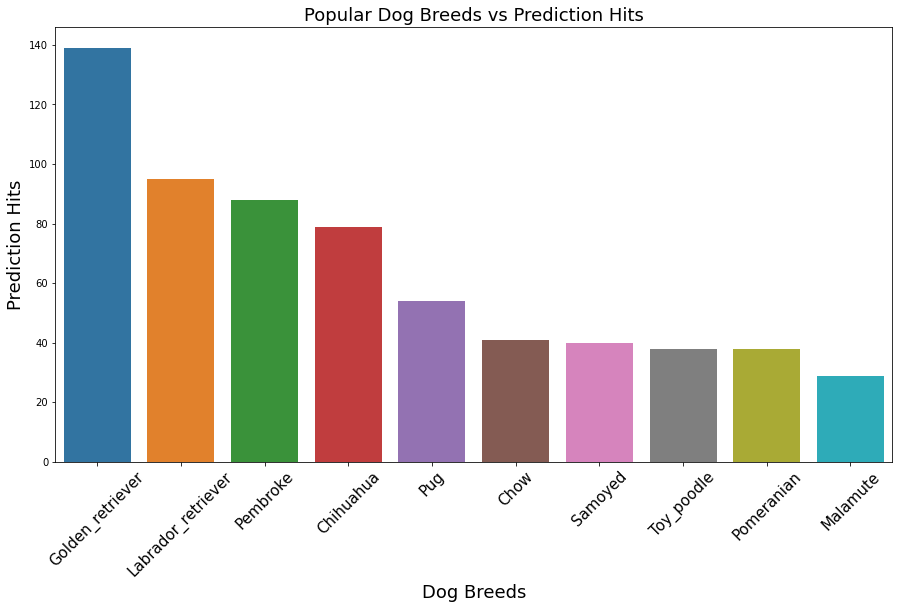

In [69]:
#Plot 
plt.figure(figsize = (15,8))
ax = sns.barplot(x = twitter['1st_prediction'].value_counts()[0:10].index,
                y =twitter['1st_prediction'].value_counts()[0:10],
                data = twitter);
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45, fontsize = 15);
plt.xlabel("Dog Breeds",fontsize = 18);
plt.ylabel("Prediction Hits",fontsize = 18);
plt.title("Popular Dog Breeds vs Prediction Hits",fontsize = 18);

### Show The Top Five Images Of The Two Most Popular Dog Breeds 

#### 1. The Top 5 Golden Retrievers

In [70]:
#Filter for breed type 'Golden_retriever'
Top_dog=twitter[twitter['1st_prediction']=="Golden_retriever"]
#Sort for the top 5 dogs with the highest confidence of 1st_presdictions
Top_dog.sort_values('1st_prediction', ascending=False).head(5)

,tweet_id,jpg_url,1st_prediction,1st_confidence,1st_dog,2nd_prediction,2nd_confidence,2nd_dog,3rd_prediction,3rd_confidence,3rd_dog,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length,retweet_count,favorite_count
10,666063827256086533,https://pbs.twimg.com/media/CT5Vg_wXIAAXfnj.jpg,Golden_retriever,0.775930,True,Tibetan_mastiff,0.093718,True,Labrador_retriever,0.072427,True,2015-11-16 01:22:45+00:00,This is the happiest dog you will ever see. Ve...,10,10,NaN,NaN,3,232,496
1547,796149749086875649,https://pbs.twimg.com/media/Cwx99rpW8AMk_Ie.jpg,Golden_retriever,0.600276,True,Labrador_retriever,0.140798,True,Seat_belt,0.087355,False,2016-11-09 00:37:46+00:00,This is Ruby. She just turned on the news. Off...,11,10,Ruby,NaN,4,16628,36177
1525,793165685325201412,https://pbs.twimg.com/media/CwHj-jGWAAAnsny.jpg,Golden_retriever,0.946224,True,Labrador_retriever,0.036477,True,Doormat,0.002353,False,2016-10-31 19:00:10+00:00,This is Benji. He's Air Bud. It's a low effort...,12,10,Benji,NaN,5,3238,10478
1530,793241302385262592,https://pbs.twimg.com/media/CwIougTWcAAMLyq.jpg,Golden_retriever,0.559308,True,Labrador_retriever,0.390222,True,Cocker_spaniel,0.036316,True,2016-11-01 00:00:38+00:00,This is Tucker. He's out here bustin h*ckin gh...,13,10,Tucker,NaN,6,3812,11780
1534,793500921481273345,https://pbs.twimg.com/media/CwMU34YWIAAz1nU.jpg,Golden_retriever,0.326122,True,Labrador_retriever,0.219904,True,Chesapeake_bay_retriever,0.163366,True,2016-11-01 17:12:16+00:00,This is Fiona. She's an extremely mediocre cop...,12,10,Fiona,NaN,5,2786,11953


###### No.1 Golden Retriever 

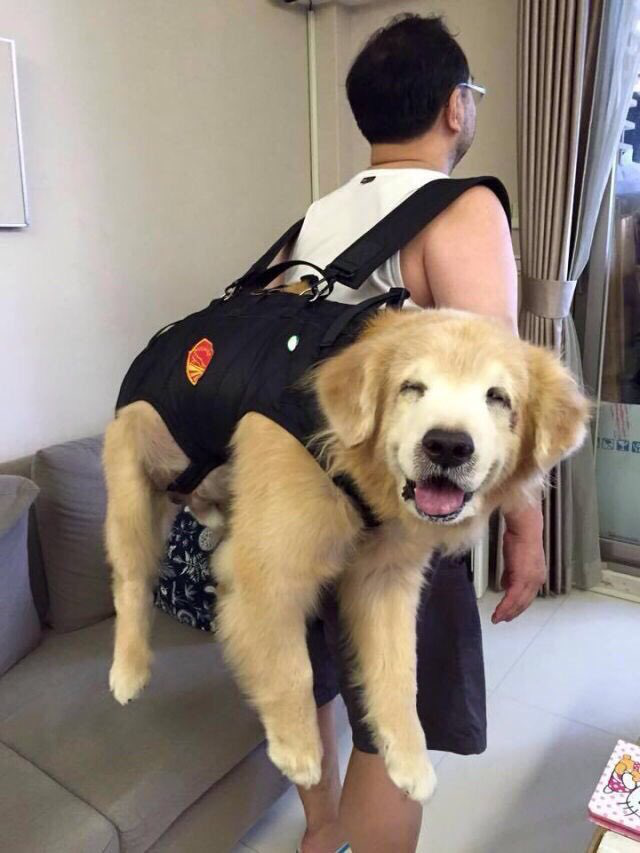

In [71]:
#The number 1 Golden Retriever Breed 
url = twitter.jpg_url[10]
r = requests.get(url)
Image.open(BytesIO(r.content))


The number one voted for Golden retriever truly lives up to it's name. Such a happy dog.

###### No.2 Golden Retriever 

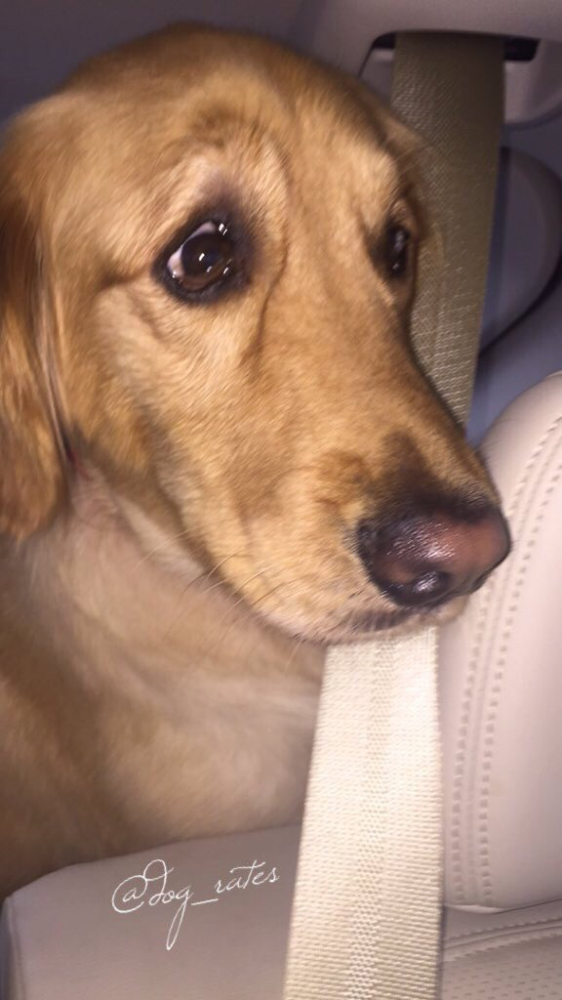

In [72]:
#The number 2 Golden Retriever Breed 
url = twitter.jpg_url[1547]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.3 Golden Retriever 

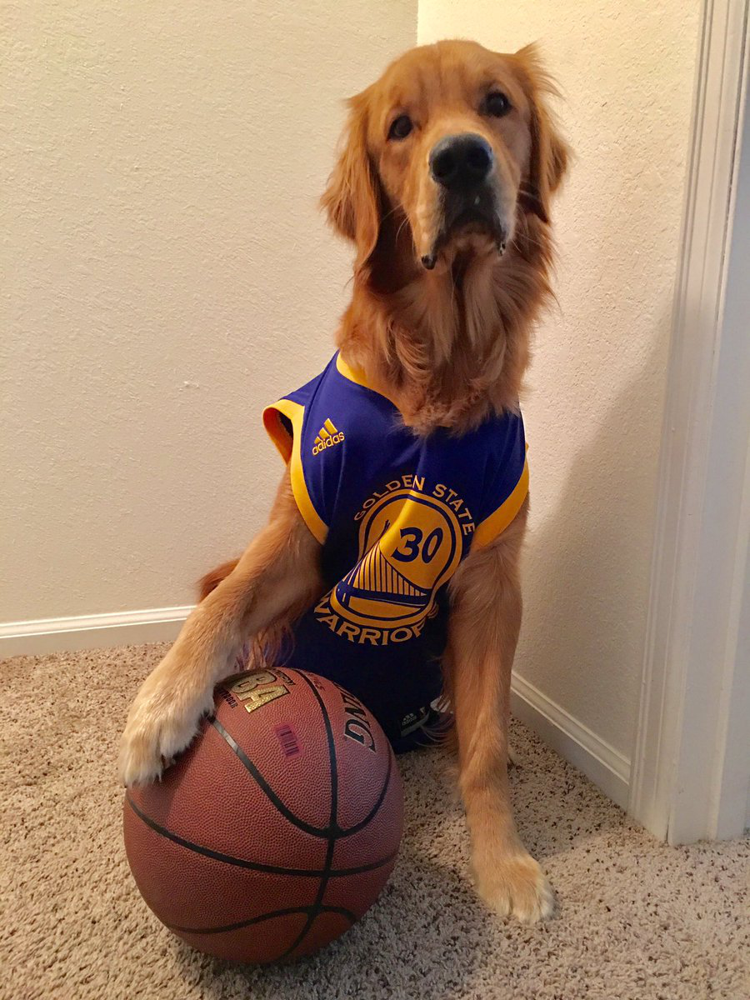

In [73]:
#The number 3 Golden Retriever Breed 
url = twitter.jpg_url[1525]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.4 Golden Retriever 

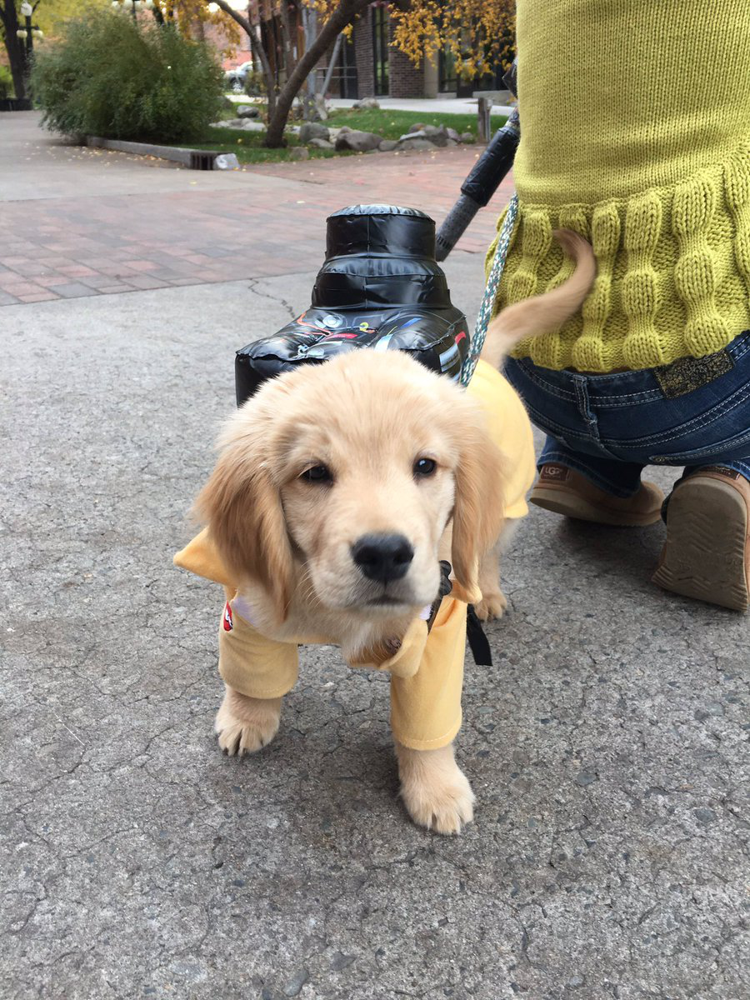

In [74]:
#The number 4 Golden Retriever Breed 
url = twitter.jpg_url[1530]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.5 Golden Retriever 

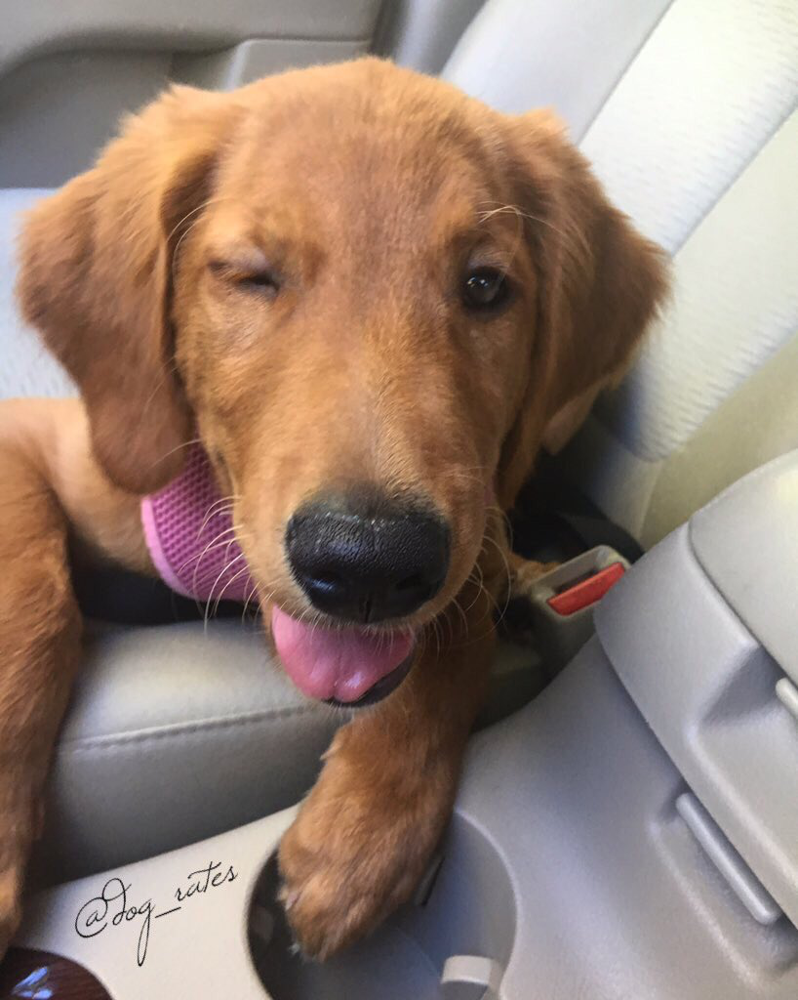

In [75]:
#The number 5 Golden Retriever Breed 
url = twitter.jpg_url[1534]
r = requests.get(url)
Image.open(BytesIO(r.content))

#### 2. The Top 5 Labradors

In [76]:
#Filter for breed type 'Labrador_retriever'
Second_rated_dog=twitter[twitter['1st_prediction']=="Labrador_retriever"]
#Sort for the top 5 dogs with the highest confidence of 1st_presdictions
Second_rated_dog.sort_values('1st_prediction', ascending=False).head(5)

,tweet_id,jpg_url,1st_prediction,1st_confidence,1st_dog,2nd_prediction,2nd_confidence,2nd_dog,3rd_prediction,3rd_confidence,3rd_dog,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length,retweet_count,favorite_count
41,666701168228331520,https://pbs.twimg.com/media/CUCZLHlUAAAeAig.jpg,Labrador_retriever,0.887707,True,Chihuahua,0.029307,True,French_bulldog,0.020756,True,2015-11-17 19:35:19+00:00,This is a golden Buckminsterfullerene named Jo...,8,10,NaN,NaN,1,234,449
1358,761976711479193600,https://pbs.twimg.com/media/CpMVxoRXgAAh350.jpg,Labrador_retriever,0.475552,True,Chesapeake_bay_retriever,0.082898,True,Staffordshire_bullterrier,0.048464,True,2016-08-06 17:26:19+00:00,This is Shelby. She finds stuff to put on her ...,12,10,Shelby,NaN,6,2310,5992
1527,793195938047070209,https://pbs.twimg.com/media/CwH_foYWgAEvTyI.jpg,Labrador_retriever,0.654762,True,Golden_retriever,0.074100,True,Chihuahua,0.042339,True,2016-10-31 21:00:23+00:00,Say hello to Lily. She's pupset that her costu...,12,10,Lily,puppo,4,6547,17063
1522,793120401413079041,https://pbs.twimg.com/media/CwG6zDfWcAA8jBD.jpg,Labrador_retriever,0.724944,True,Golden_retriever,0.169744,True,Kuvasz,0.035502,True,2016-10-31 16:00:13+00:00,This is Robin. She's desperately trying to do ...,11,10,Robin,NaN,5,4551,14202
1508,790277117346975746,https://pbs.twimg.com/media/Cveg1-NXgAASaaT.jpg,Labrador_retriever,0.427742,True,Great_dane,0.190503,True,Curly-coated_retriever,0.146427,True,2016-10-23 19:42:02+00:00,This is Bruce. He never backs down from a chal...,11,10,Bruce,NaN,5,3732,14081


###### No.1 Labrador Retriever 

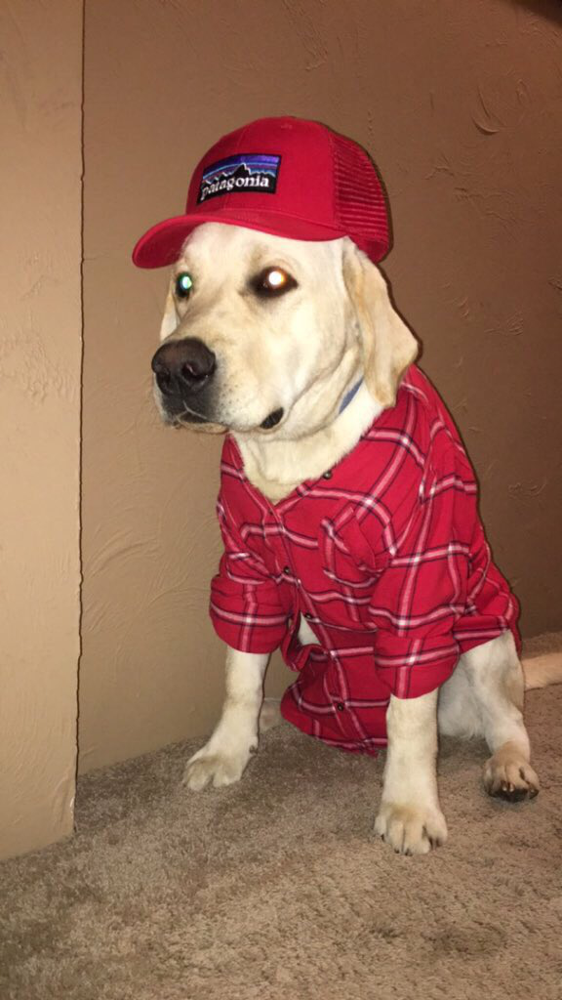

In [77]:
#The number 1 Labrador Retriever Breed 
url = twitter.jpg_url[41]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.2 Labrador Retriever 

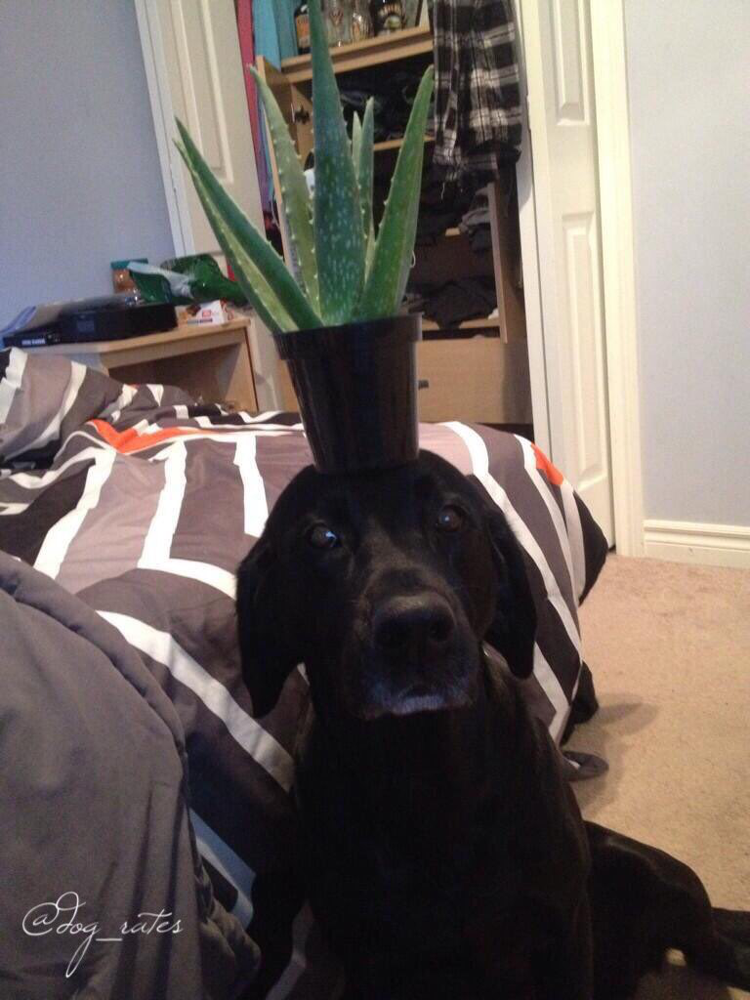

In [78]:
#The number 2 Labrador Retriever Breed 
url = twitter.jpg_url[1358]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.3 Labrador Retriever 

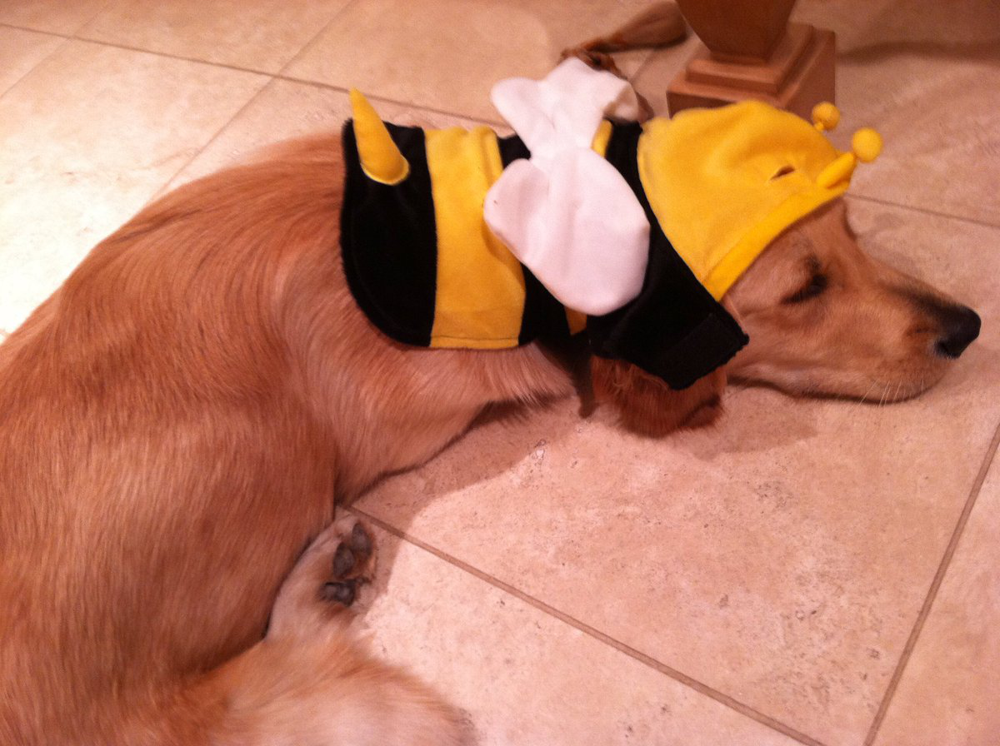

In [79]:
#The number 3 Labrador Retriever Breed 
url = twitter.jpg_url[1527]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.4 Labrador Retriever 

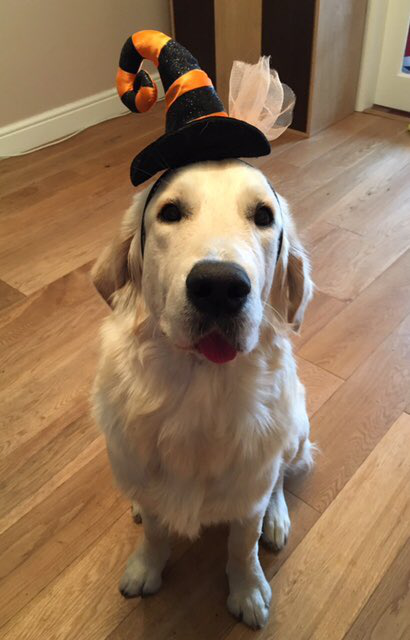

In [80]:
#The number 4 Labrador Retriever Breed 
url = twitter.jpg_url[1522]
r = requests.get(url)
Image.open(BytesIO(r.content))

###### No.5 Labrador Retriever 

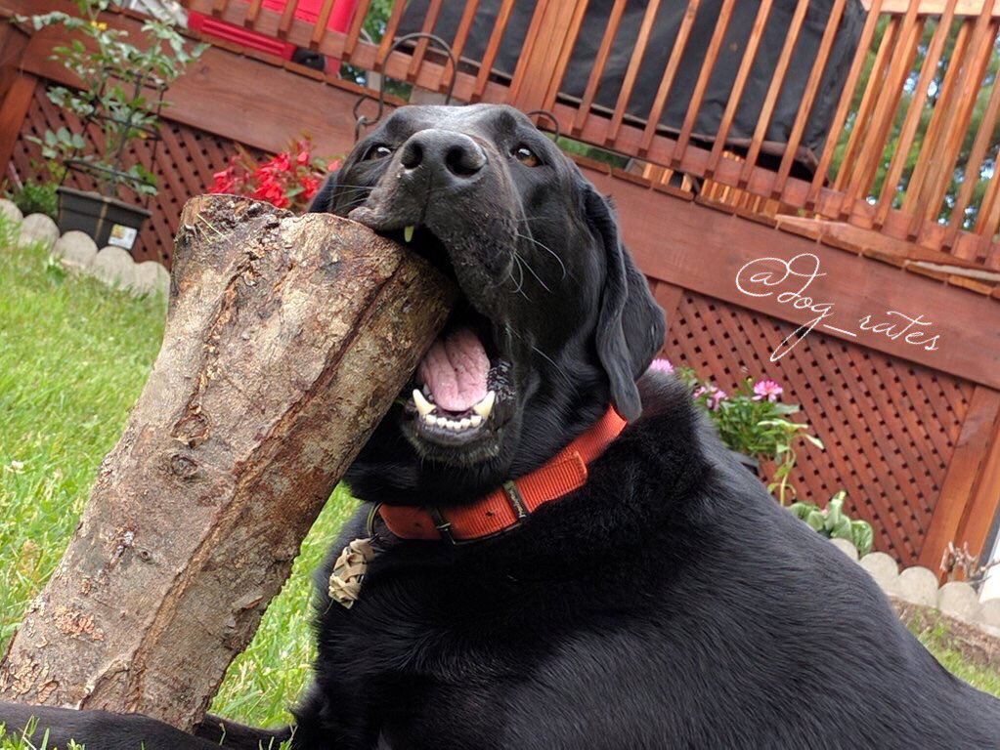

In [81]:
#The number 5 Labrador Retriever Breed 
url = twitter.jpg_url[1508]
r = requests.get(url)
Image.open(BytesIO(r.content))

### Show Popularity of Dog Types Against Dog Predictions

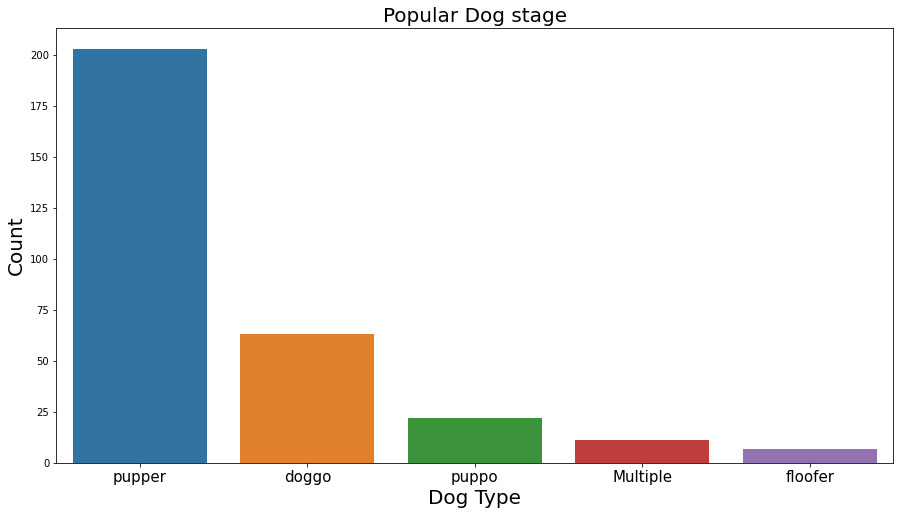

In [82]:
plt.figure(figsize = (15,8))
ax = sns.barplot(x = twitter['dog_type'].value_counts()[0:10].index,
                y =twitter['dog_type'].value_counts()[0:10],
                data = twitter);
ax.set_xticklabels(ax.get_xticklabels(),rotation = 0, fontsize = 15);
plt.xlabel("Dog Type",fontsize = 20);
plt.ylabel("Count",fontsize = 20);
plt.title("Popular Dog stage",fontsize = 20);

The Pupper was most rated dog type as clearly shown in the graph above.

###### Show The Top 2 Images Of The Most Liked Dog Type 

In [83]:
#Filter for top 5 most rated dog_type by likes
Pupper=twitter.sort_values('favorite_count',ascending=False);
Pupper=Pupper[['tweet_id','favorite_count','jpg_url','dog_type','1st_prediction']]
Pupper.head(2)

,tweet_id,favorite_count,jpg_url,dog_type,1st_prediction
1684,822872901745569793,132810,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,puppo,Lakeland_terrier
1218,744234799360020481,131075,https://pbs.twimg.com/ext_tw_video_thumb/74423...,doggo,Labrador_retriever


###### No.1 Most Liked Dog Type

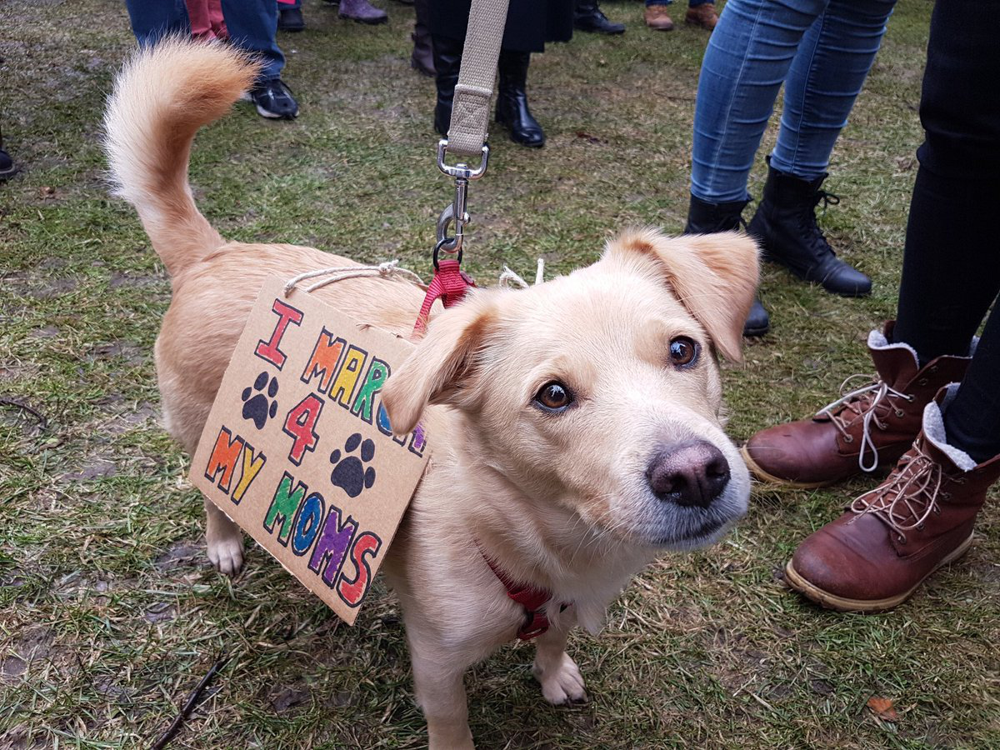

In [84]:
#The most liked dog type
url = twitter.jpg_url[1684]
r = requests.get(url)
Image.open(BytesIO(r.content))

Seeing the above picture of the Lakeland Terrier, it is easy to see why it was the most voted Pupper Dog Type. So cute.

###### No.2 Most Liked Dog Type

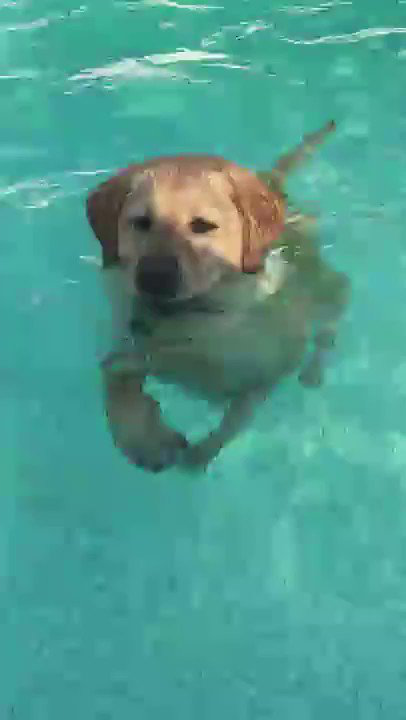

In [85]:
#The Second most liked dog type
url = twitter.jpg_url[1218]
r = requests.get(url)
Image.open(BytesIO(r.content))

### Show Voter Distribution In The Time Period Which The Data Was Gathered

In [86]:
#Extracting Year for the Datetime in Timestamp
twitter['timestamp'] = pd.to_datetime(twitter['timestamp'])

twitter['year'] = twitter['timestamp'].dt.year

#twitter_date.groupby('timestamp' ['tweet_id'].count().plot(kind='pie', figsize=(10, 10));
twitter.sample(5)


,tweet_id,jpg_url,1st_prediction,1st_confidence,1st_dog,2nd_prediction,2nd_confidence,2nd_dog,3rd_prediction,3rd_confidence,...,timestamp,tweet,rating_numerator,rating_denominator,name,dog_type,name_length,retweet_count,favorite_count,year
1254,748575535303884801,https://pbs.twimg.com/media/CmN5ecNWMAE6pnf.jpg,Muzzle,0.176172,False,Seat_belt,0.160953,False,Soft-coated_wheaten_terrier,0.086499,...,2016-06-30 17:54:50+00:00,This is one of the most reckless puppers I've ...,6,10,One,NaN,3,2272,6696,2016
1863,860276583193509888,https://pbs.twimg.com/media/C_BQ_NlVwAAgYGD.jpg,Lakeside,0.312299,False,Dock,0.159842,False,Canoe,0.070794,...,2017-05-04 23:34:55+00:00,This is Jordy. He likes to go on adventures an...,12,10,Jordy,NaN,5,3745,19154,2017
61,667152164079423490,https://pbs.twimg.com/media/CUIzWk_UwAAfUNq.jpg,Toy_poodle,0.535411,True,Pomeranian,0.087544,True,Miniature_poodle,0.062050,...,2015-11-19 01:27:25+00:00,This is Pipsy. He is a fluffball. Enjoys trave...,12,10,Pipsy,NaN,5,18285,49720,2015
963,706265994973601792,https://pbs.twimg.com/media/Cc0pLU0WAAEfGEw.jpg,Papillon,0.743715,True,Pekinese,0.114042,True,Saint_bernard,0.047715,...,2016-03-05 23:51:49+00:00,This is Kara. She's been trying to solve that ...,11,10,Kara,NaN,4,1030,2979,2016
524,676613908052996102,https://pbs.twimg.com/media/CWPQwmJWUAAu_At.jpg,Book_jacket,0.493790,False,Doberman,0.096423,True,Miniature_pinscher,0.070647,...,2015-12-15 04:05:01+00:00,This is the saddest/sweetest/best picture I've...,12,10,NaN,NaN,3,219,1183,2015


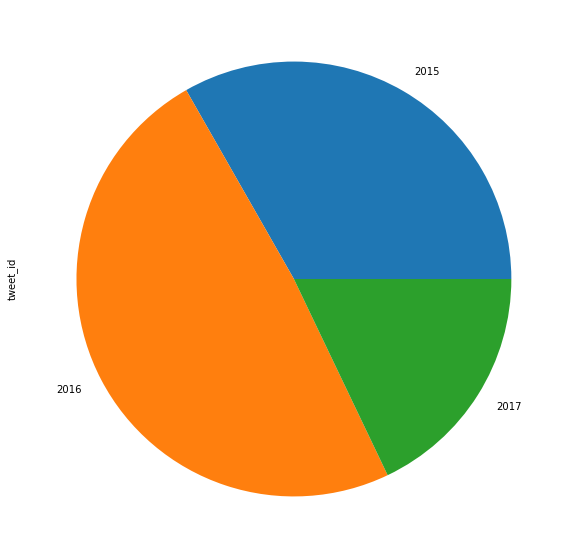

In [87]:
#Show Voter Distribution In The Period Which The Votes Were Taken In A Pie Chart 
twitter.groupby("year")['tweet_id'].count().plot(kind='pie', figsize=(10, 10));

The Pie Chart above shows that the majority of the Votes were achieved in the year 2016. This can be further investigated to find out why votes reduced in 2017.

### Show The Virality (Spreading) Distribution Of  Dog Favorites In The Form Of Retweets

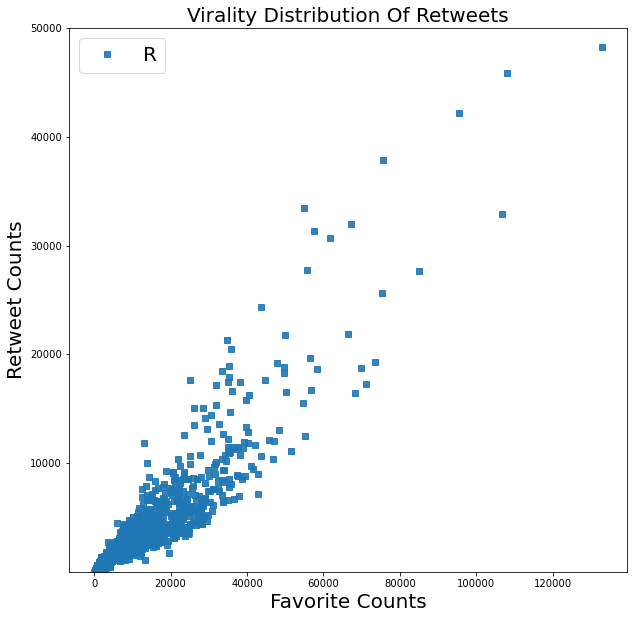

In [88]:
#Plot a Scatter plot to show the spread of retweet_counts over time against favorite counts
twitter.plot(y='retweet_count',x='favorite_count', style='s',alpha=0.9,figsize=(10,10),ylim=[10,50000]);
plt.legend("Retweet Counts",fontsize = 20);
plt.xlabel("Favorite Counts",fontsize = 20);
plt.ylabel("Retweet Counts",fontsize = 20);
plt.title("Virality Distribution Of Retweets",fontsize = 20);

Above we can see the virallity (often referred to as Viral Tweet) of tweets distribution across dog with the most favorite counts.

## Conclusions

1. By wranglying the provided data sets, one clearly sees the impact and importance of methodological processes of cleaning data and documentation of each step to allow the reviewer to follow logically the steps and methods employed by the Data Analyst
2. It is clear, that data not always useful in it's raw form, until it is manipulated without altering the rawness of the data to get a picture of what the data is trying to paint.